In [3]:
import pandas as pd
import ruamel.yaml as yaml
import os
import numpy as np
import sys
import altair as alt
alt.themes.enable('opaque')

# ## Change to Root

# In[15]:


NO_CONFIG_ERR_MSG = """No config file found. Root directory is determined by presence of "config.yaml" file."""        

original_wd = os.getcwd()

# Number of times to move back in directory
num_retries = 10
for x in range(0, num_retries):
    # try to load config file    
    try:
        with open("config.yaml", 'r') as stream:
            cfg = yaml.safe_load(stream)
    # If not found move back one directory level
    except FileNotFoundError:
        os.chdir('../')
        # If reached the max number of directory levels change to original wd and print error msg
        if x+1 == num_retries:
            os.chdir(original_wd)
            print(NO_CONFIG_ERR_MSG)
            
# Add directory to PATH
path = os.getcwd()

if path not in sys.path:
    sys.path.append(path)

In [6]:
clustering_results = pd.read_csv('results/clustering_results.csv')
grid_search_results = pd.read_csv('results/grid_search_results.csv')
tsne_results = pd.read_csv('results/tsne_results.csv')
component_quality_results = pd.read_csv('results/component_quality.csv')

## Fix Redundant naming of clustering algorithms
clustering_alg_map = {
    'K_Means':'K-Means',
     'EM':'EM',
     'GMM':'EM',
     'Kmeans':'K-Means',
}

clustering_results['Clustering_Algorithm'] = clustering_results['Clustering_Algorithm'].map(clustering_alg_map)
clustering_results['Clustering_Algorithm'].value_counts()

K-Means    270
EM         270
Name: Clustering_Algorithm, dtype: int64

In [7]:
## Pull Mean Train Time and Test Scores marginalized across other params
mean_test_score_col = 'mean_test_score'
mean_fit_time_col = 'mean_fit_time'

anchor_cols = [
 'N_Components/Clusters/Features',
 'Data_Perspective',
 'Dataset',
 'Clustering_Algorithm',
 ]

test_score_grid_search_results = (grid_search_results.groupby(by=anchor_cols)
                                  .mean()[mean_test_score_col] # Take the average across all other parameters
                                  .reset_index()
                                  .rename(columns={mean_test_score_col:'Test_Score'}) # Rename so that it populates the Metric Column
                                  .melt(id_vars=anchor_cols, var_name='Metric', value_name='Value'))

train_time_grid_search_results = (grid_search_results.groupby(by=anchor_cols)
                                  .mean()[mean_fit_time_col] # Take the average across all other parameters
                                  .reset_index()
                                  .rename(columns={mean_fit_time_col:'Fit_Time'}) # Rename so that it populates the Metric Column
                                  .melt(id_vars=anchor_cols, var_name='Metric', value_name='Value'))
tidy_grid_search_results = pd.concat([test_score_grid_search_results, train_time_grid_search_results])

In [8]:
tidy_grid_search_results.columns.values.tolist()

['N_Components/Clusters/Features',
 'Data_Perspective',
 'Dataset',
 'Clustering_Algorithm',
 'Metric',
 'Value']

## Adding in BASELINE data for Clustering Algorithm = None

In [9]:
mean_test_score_col = 'mean_test_score'
mean_fit_time_col = 'mean_fit_time'

anchor_cols = [
 'Dataset',
 'Clustering_Algorithm',
 ]
metric_rename_dict = {mean_test_score_col:'Test_Score', mean_fit_time_col:'Fit_Time'}

tidy_benchmark_results = []
for dataset in ['Madelon', 'Cars']:
    benchmark = pd.read_csv(f'BASE/{dataset} NN bmk.csv')
    for metric, renamed_metric in metric_rename_dict.items():
        # The value is taken across all parameter values
        avg_across_all_params = benchmark[metric].mean()
        # N Components DataFrame to concat
        n_components = np.arange(2, tidy_grid_search_results['N_Components/Clusters/Features'].max(), 5).tolist()
        tidy_results = pd.DataFrame(n_components, columns=['N_Components/Clusters/Features'])
        tidy_results['Data_Perspective'] = 'BASE'
        tidy_results['Dataset'] = dataset
        tidy_results['Clustering_Algorithm'] = 'None'
        tidy_results['Metric'] = metric_rename_dict[metric]
        tidy_results['Value'] = avg_across_all_params
        
        tidy_benchmark_results.append(tidy_results)
tidy_benchmark_results = pd.concat(tidy_benchmark_results)

## Add to tidy grid search results
tidy_grid_search_results = pd.concat([tidy_grid_search_results, tidy_benchmark_results])

In [10]:
cars_base.head()

NameError: name 'cars_base' is not defined

In [ ]:
tidy_grid_search_results.head()

In [ ]:
categories = [col for col in clustering_results.columns.values.tolist()
                   if (col != 'N_Clusters') & (col != 'Value')
                   ]
for col in categories:
    print(col)
    display(clustering_results[col].unique())

#

## An Approach to Analysis

###### Component Analysis
* Evaluate along reconstruction error and specific valuations (adj mutual info, explained variance, etc)


###### Clustering
1) Start with the baseline

2) Under BASE data, evaluate clusters
    
    * Across N for K Means
        * SSE 
    * Across N for EM
        * Log Likelihood
        
3) Relationship to Target Class
    * Evaluate Mutual Information
    
    * Evaluate Accuracy
    
4) In Later Analysis return and do the same for PCA, ICA, RP and possibly RF    

Reconstruction Error

In [ ]:
# alt.Chart(component_quality_results).mark_line().encode(
#     x='N_Components:O',
#     y='Value:Q',
#     color='Dataset:N',
#     column='Data_Perspective:N'
# ).transform_filter(
#     alt.datum.Metric == 'Reconstruction_Error'
# ).interactive()

alt.Chart(component_quality_results).mark_line().encode(
    x='N_Components:O',
    y='Value:Q',
    color='Data_Perspective:N',
    column='Dataset:N'
).transform_filter(
    alt.datum.Metric == 'Reconstruction_Error'
).properties(
    title='Reconstruction Error Across Number of Components'
).interactive()
# .transform_filter(
#     alt.datum.Data_Perspective == 'PCA'
# ).interactive()

#### Component Quality

In [ ]:
metric_dict = {
    'ICA':'Avg_Component_Absolute_Kurtosis',
    'PCA':'Explained_Variance',
    'RP':'Projected_Pairwise_Distance_10_Trial_Correlation_Avg'
}

metric_title_dict = {
    'ICA':'Avg_Kurtosis',
    'PCA':'Explained_Variance',
    'RP':'Correlation'
}

In [ ]:
component_quality_charts = []
for alg, metric in metric_dict.items():
    metric_title_name = metric_title_dict[alg]
    chart = alt.Chart(component_quality_results).mark_line().encode(
        x='N_Components:Q',
        y='Value:Q',
        color='Dataset:N',
    ).transform_filter(
        (alt.datum.Metric == metric)
        & (alt.datum.Data_Perspective == alg)
    ).properties(
        title=f'{alg} measured by {metric_title_name}'
    ).interactive()
#     display(chart)
    component_quality_charts.append(chart)

In [ ]:
alt.hconcat(component_quality_charts[0], component_quality_charts[1], component_quality_charts[2])

In [ ]:
alt.vconcat(component_quality_charts[0], component_quality_charts[1], component_quality_charts[2])

## Best components using Test Set Scores

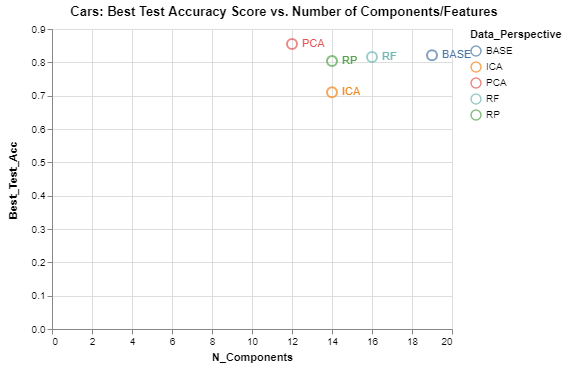

In [11]:
best_components_test_set = pd.read_csv('results/best_N_components_by_test_score.csv')
best_components_test_set
cars_scatter = alt.Chart(best_components_test_set).mark_point(size=100).encode(
    x='N_Components:Q',
    y='Best_Test_Acc:Q',
    color='Data_Perspective:N'
).transform_filter(
    (alt.datum.Dataset == 'Cars')
).properties(
    title='Cars: Best Test Accuracy Score vs. Number of Components/Features'
)

#alt.vconcat(cars_scatter, madelon_scatter)
cars_scatter
cars_scatter_text = cars_scatter.mark_text(
    align='left',
    baseline='middle',
    dx=10
).encode(
    text='Data_Perspective:N'
)


cars_scatter + cars_scatter_text


What's the test score for Base since it's way off for 500 features?

In [12]:
best_components_test_set.query('Dataset == "Madelon"'
                              '& Data_Perspective == "BASE"'
                              )

,Data_Perspective,Dataset,N_Components,Best_Test_Acc
8,BASE,Madelon,500,0.553846


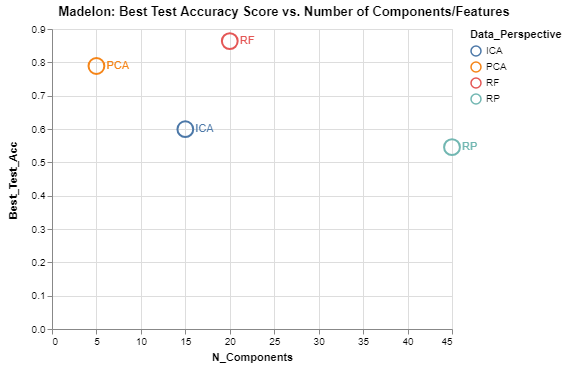

In [13]:
madelon_scatter = alt.Chart(best_components_test_set).mark_point(size=250, opacity=1).encode(
    x='N_Components:Q',
    y='Best_Test_Acc:Q',
    color='Data_Perspective:N'
).transform_filter(
    (alt.datum.Data_Perspective != 'BASE') & (alt.datum.Dataset == 'Madelon')
).properties(
    title='Madelon: Best Test Accuracy Score vs. Number of Components/Features'
)

madelon_scatter_text = madelon_scatter.mark_text(
    align='left',
    baseline='middle',
    dx=10
).encode(
    text='Data_Perspective:N'
)

madelon_scatter + madelon_scatter_text

Both together

In [14]:
# alt.Chart(best_components_test_set).mark_point(size=250, opacity=1).encode(
#     x=alt.X('N_Components:Q', scale=alt.Scale(domain=(0, 50))),
#     y='Best_Test_Acc:Q',
#     row='Dataset:N',
#     color='Data_Perspective:N'
# )

## Grid Search Viz

In [15]:
tidy_grid_search_results.Metric.value_counts()

Test_Score    295
Fit_Time      295
Name: Metric, dtype: int64

In [98]:
metric_to_chart = 'Test_Score'
# alt.Chart(tidy_grid_search_results).mark_line().encode(
#     alt.X('N_Components/Clusters/Features:O'),
#     alt.Y('Value:Q', scale=alt.Scale(domain=[.5, 1])),
#     color='Data_Perspective:N',
#     column='Clustering_Algorithm:N',
#     row='Dataset'
# ).transform_filter(
#     alt.datum.Metric == metric_to_chart
# ).interactive()

grid_search_charts = []
for metric in ['Test_Score', 'Fit_Time']:
    # Fix Y Limits to zoom in a bit
    if metric == 'Test_Score':
        grid_search_chart = alt.Chart(tidy_grid_search_results).mark_line().encode(
            alt.X('N_Components/Clusters/Features:O'),
            alt.Y('Value:Q'),
            color='Data_Perspective:N').facet(
            title=f'{metric} Scores Across Clustering Algorithms',
            column='Clustering_Algorithm:N',
            row='Dataset:N').transform_filter(
            (alt.datum.Metric == metric)).interactive()
    else:
        grid_search_chart = alt.Chart(tidy_grid_search_results).mark_line().encode(
            alt.X('N_Components/Clusters/Features:O'),
            alt.Y('Value:Q'),
            color='Data_Perspective:N').facet(
            title=f'{metric} Scores Across Clustering Algorithms',
            column='Clustering_Algorithm:N',
            row='Dataset:N').transform_filter(
            (alt.datum.Metric == metric)
            & (alt.datum.Data_Perspective != 'BASE') # Remove Base b/c it skews the axis too much
            # Comparison is over clustering charts only (basically )
        ).interactive()
    grid_search_charts.append(grid_search_chart)
#alt.vconcat(*grid_search_charts)    

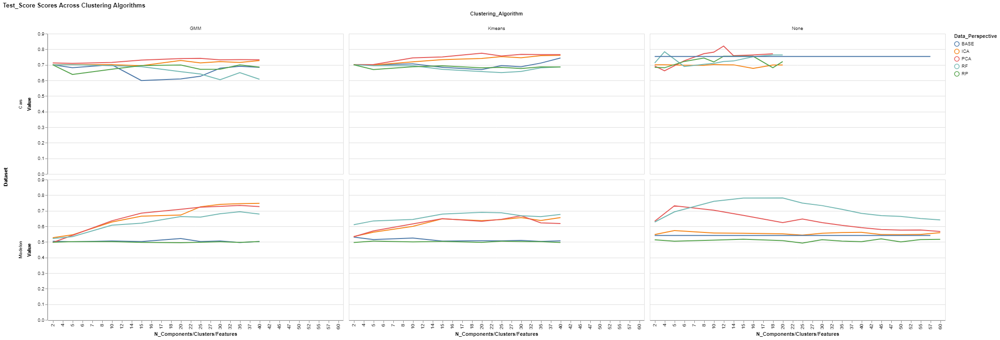

In [99]:
grid_search_charts[0]

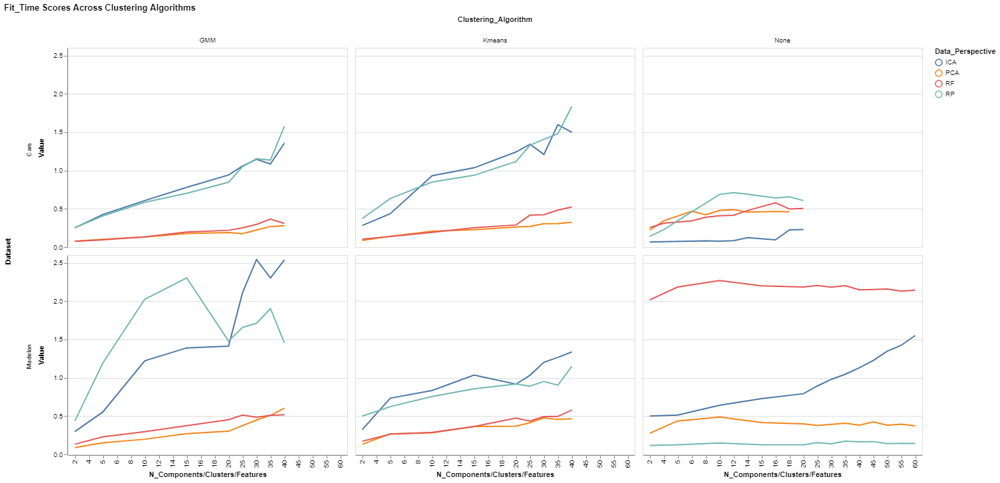

In [58]:
grid_search_charts[1]

## Variation of N across K Means and EM

In [19]:
clustering_results.Clustering_Algorithm.unique()

array(['K-Means', 'EM'], dtype=object)

In [20]:
representation = 'BASE'
algorithms = ['K_Means', 'EM']
datasets = ['Madelon', 'Cars']
clustering_quality_metrics = ['SSE', 'log-likelihood']
classifcation_metrics = ['Accuracy', 'Mutual Information']
clustering_results.query('Data_Perspective == @representation').head()

,Clustering_Algorithm,N_Clusters,Dataset,Metric,Value,Data_Perspective
0,K-Means,2,Madelon,SSE,901709.421231,BASE
1,K-Means,5,Madelon,SSE,891880.862735,BASE
2,K-Means,10,Madelon,SSE,885554.749546,BASE
3,K-Means,15,Madelon,SSE,881723.610571,BASE
4,K-Means,20,Madelon,SSE,878695.336027,BASE


Across Datasets

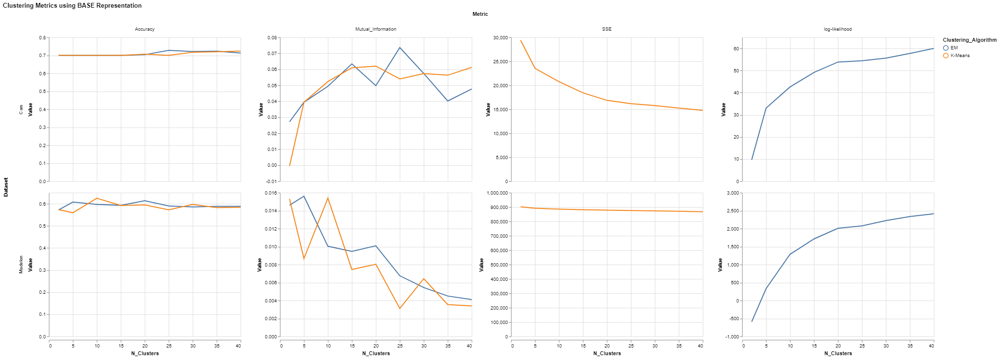

In [24]:
clustering_chart = alt.Chart(clustering_results).mark_line().encode(
            x=alt.X('N_Clusters:Q'),
            y=alt.Y('Value:Q'),
            color='Clustering_Algorithm'
        ).facet(
            title=f'Clustering Metrics using {representation} Representation',
            column='Metric',
            row='Dataset',
        ).resolve_scale(
            y='independent'
        ).transform_filter(
            (alt.datum.Data_Perspective == representation)
        ).interactive()
clustering_chart

Across Clustering Algorithms

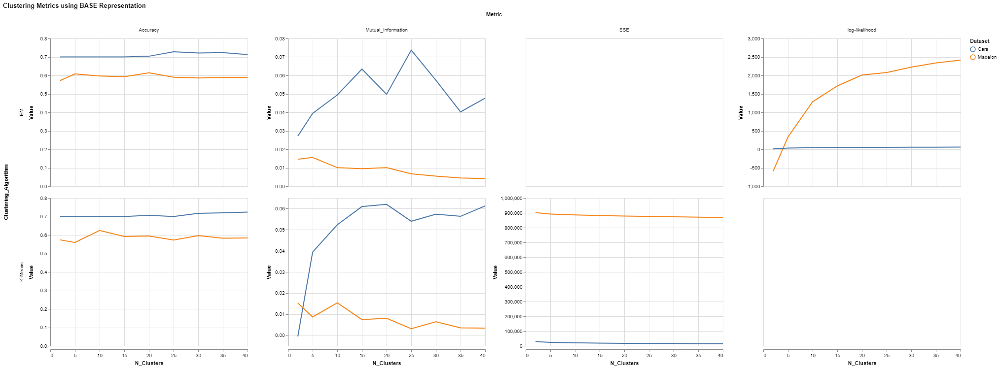

In [25]:
clustering_chart = alt.Chart(clustering_results).mark_line().encode(
            x=alt.X('N_Clusters:Q'),
            y=alt.Y('Value:Q'),
            color='Dataset'
        ).facet(
            title=f'Clustering Metrics using {representation} Representation',
            column='Metric',
            row='Clustering_Algorithm',
        ).resolve_scale(
            y='independent'
        ).transform_filter(
            (alt.datum.Data_Perspective == representation)
        ).interactive()
clustering_chart


BASE



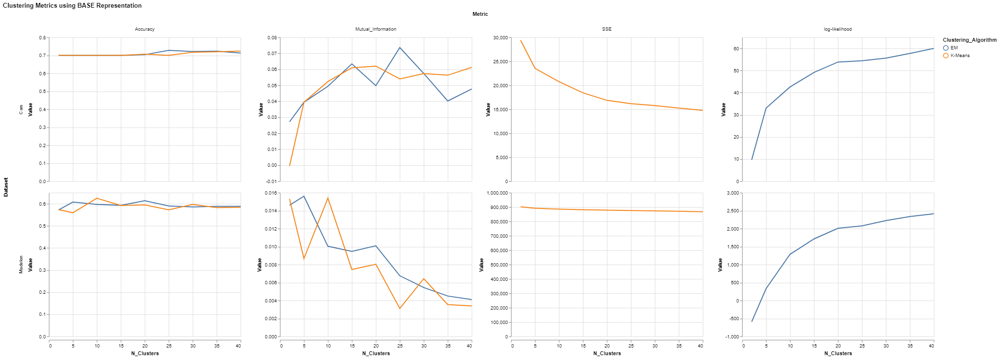



ICA



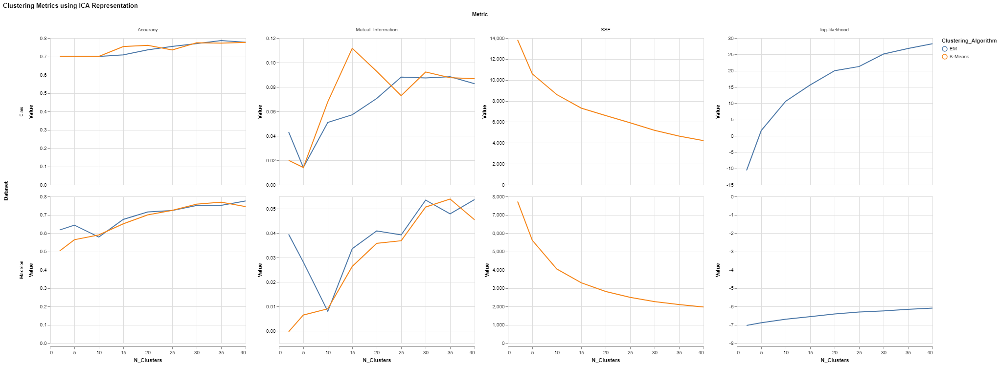



PCA



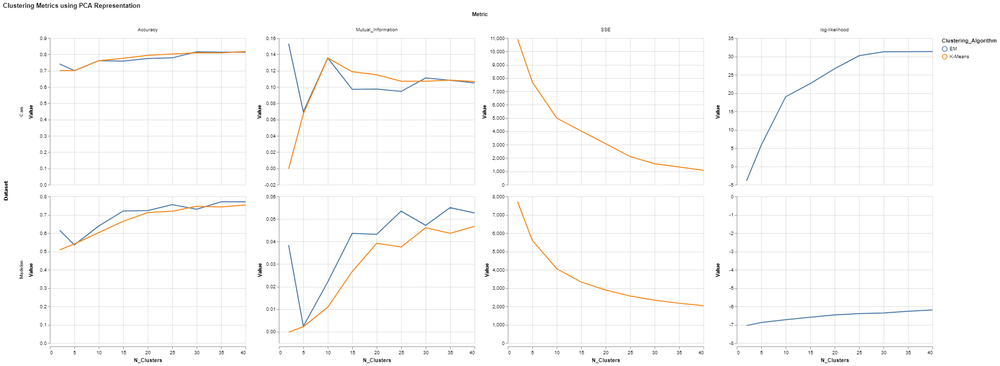



RP



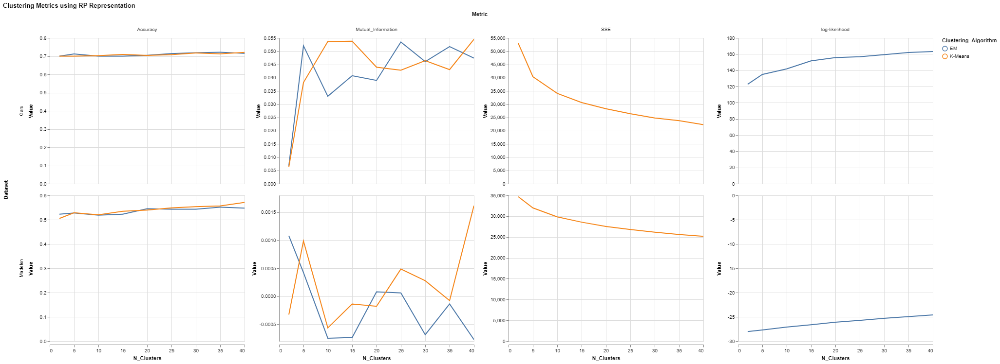



RF



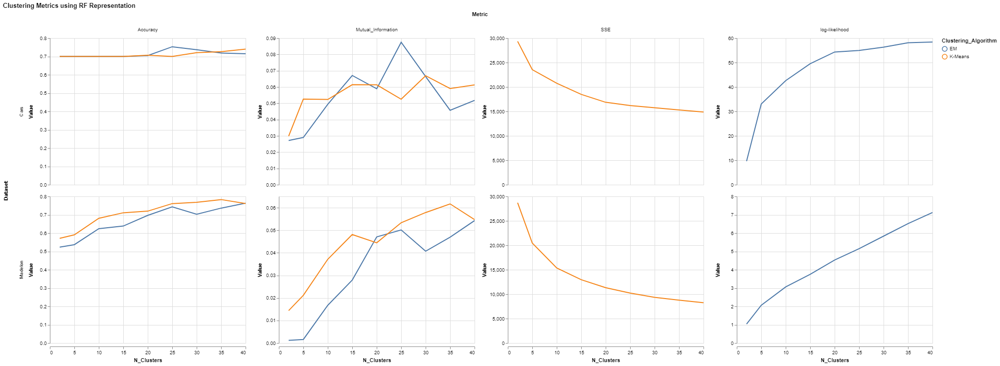

In [26]:
# clustering_metric_charts_collection = []
# for dataset in datasets:
#     clustering_chart = alt.Chart(clustering_results).mark_bar().encode(
#         x=alt.X('N_Clusters:Q'),
#         y=alt.Y('Value:Q'),
#         color='Clustering_Algorithm'
#     ).properties(
#         title='Clustering Metric Evaluations',
#         width=300,
#         height=150,
#     ).facet(
#         title=f'Clustering Metrics for {dataset} dataset',
#         column='Metric',
#         row='Clustering_Algorithm',
#     ).resolve_scale(
#         y='independent'
#     ).transform_filter(
#         (alt.datum.Data_Perspective == representation)
#         &
#         (alt.datum.Dataset == dataset)
#     )
#     #display(clustering_chart)
#     clustering_metric_charts_collection.append(clustering_chart)
    
# alt.vconcat(*clustering_metric_charts_collection)

def clustering_bar_metrics(clustering_metrics_df, datasets_lst, data_representation):
    """Given a tidy clustering metrics df and a list of datasets to subset and aggreagte by,
    as well as a data reprentation filter (e.g. 'PCA', 'ICA', etc) generate a compound chart
    across metrics and number of clusters
    """
    
    clustering_metric_charts_collection = []
    for dataset in datasets_lst:
        clustering_chart = alt.Chart(clustering_results).mark_bar().encode(
            x=alt.X('N_Clusters:Q'),
            y=alt.Y('Value:Q'),
            color='Clustering_Algorithm'
        ).properties(
            title='Clustering Metric Evaluations',
            width=300,
            height=150,
        ).facet(
            title=f'Clustering Metrics for {dataset} dataset',
            column='Metric',
            row='Clustering_Algorithm',
        ).resolve_scale(
            y='independent'
        ).transform_filter(
            (alt.datum.Data_Perspective == representation)
            &
            (alt.datum.Dataset == dataset)
        )
        #display(clustering_chart)
        clustering_metric_charts_collection.append(clustering_chart)
    compound_chart = alt.vconcat(*clustering_metric_charts_collection)
    return compound_chart
        

    
def clustering_line_metrics(clustering_metrics_df, data_representation):
    """Given a tidy clustering metrics df and a list of datasets to subset and aggreagte by,
    as well as a data reprentation filter (e.g. 'PCA', 'ICA', etc) generate a compound chart
    across metrics and number of clusters
    """
    
    clustering_chart = alt.Chart(clustering_metrics_df).mark_line().encode(
        x=alt.X('N_Clusters:Q'),
        y=alt.Y('Value:Q'),
        color='Clustering_Algorithm'
    ).facet(
        title=f'Clustering Metrics using {data_representation} Representation',
        column='Metric',
        row='Dataset',
    ).resolve_scale(
        y='independent'
    ).transform_filter(
        (alt.datum.Data_Perspective == representation)
    ).interactive()
    return clustering_chart

for representation in clustering_results.Data_Perspective.unique():
    print(f'\n{representation}\n')
    display(clustering_line_metrics(clustering_results, representation))
    print()

## Could put all representations onto 1 chart by combining Dataset-representation

In [31]:
clustering_results['Dataset-Perspective'] = clustering_results['Dataset'] + '-' +clustering_results['Data_Perspective']
clustering_results.head()

,Clustering_Algorithm,N_Clusters,Dataset,Metric,Value,Data_Perspective,Dataset-Perspective
0,K-Means,2,Madelon,SSE,901709.421231,BASE,Madelon-BASE
1,K-Means,5,Madelon,SSE,891880.862735,BASE,Madelon-BASE
2,K-Means,10,Madelon,SSE,885554.749546,BASE,Madelon-BASE
3,K-Means,15,Madelon,SSE,881723.610571,BASE,Madelon-BASE
4,K-Means,20,Madelon,SSE,878695.336027,BASE,Madelon-BASE



Madelon



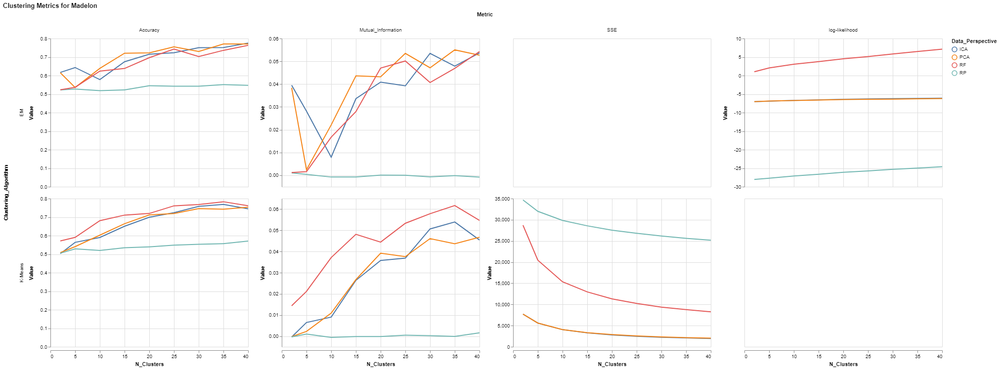


Cars



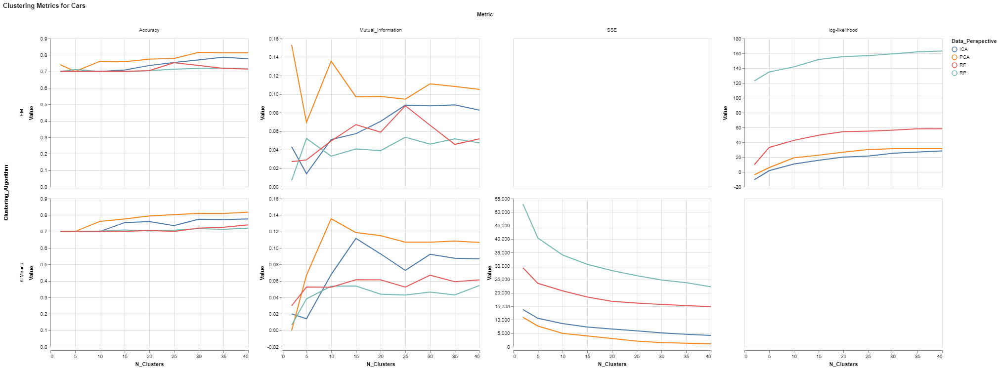

In [51]:
clustering_results_charts = []
for dataset in clustering_results.Dataset.unique():
    print(f'\n{dataset}\n')
    clustering_chart = alt.Chart(clustering_results).mark_line().encode(
        x=alt.X('N_Clusters:Q'),
        y=alt.Y('Value:Q'),
        color='Data_Perspective'
    ).facet(
        title=f'Clustering Metrics for {dataset}',
        column='Metric',
        row='Clustering_Algorithm',
    ).resolve_scale(
        y='independent'
    ).transform_filter(
        (alt.datum.Dataset == dataset)
        & (alt.datum.Data_Perspective != 'BASE')
    ).interactive()
    display(clustering_chart)
    clustering_results_charts.append(clustering_chart)

In [50]:
#alt.vconcat(*clustering_results_charts)

## Cutting out BASE b/c of MAdelon axis issues 


Madelon



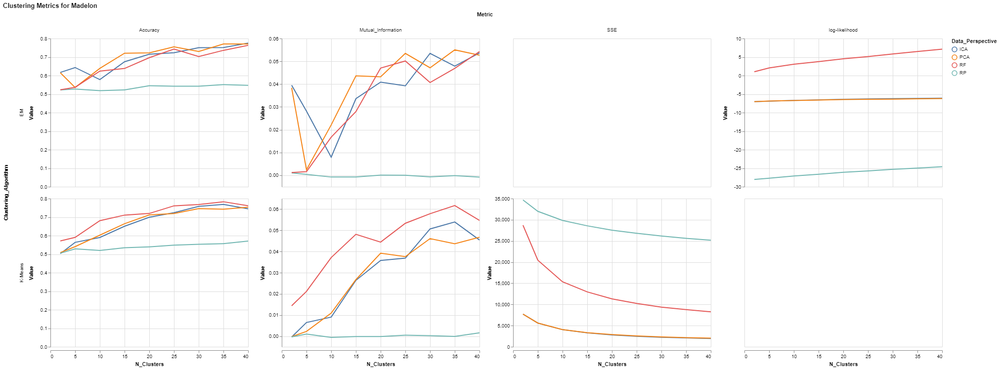



Cars



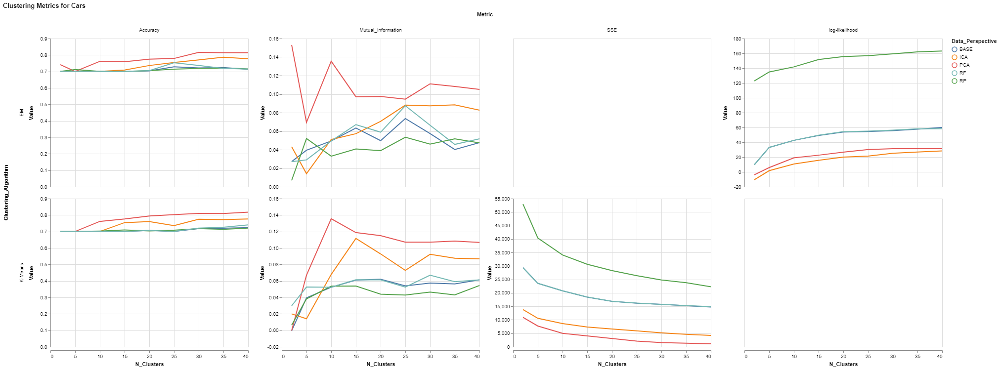

In [97]:

for dataset in clustering_results.Dataset.unique():
    print(f'\n{dataset}\n')
    if dataset == 'Madelon':
        clustering_chart = alt.Chart(clustering_results).mark_line().encode(
            x=alt.X('N_Clusters:Q'),
            y=alt.Y('Value:Q'),
            color='Data_Perspective'
        ).facet(
            title=f'Clustering Metrics for {dataset}',
            column='Metric',
            row='Clustering_Algorithm',
        ).resolve_scale(
            y='independent'
        ).transform_filter(
            (alt.datum.Dataset == dataset)
            & (alt.datum.Data_Perspective != 'BASE')
        ).interactive()
    else:
        clustering_chart = alt.Chart(clustering_results).mark_line().encode(
            x=alt.X('N_Clusters:Q'),
            y=alt.Y('Value:Q'),
            color='Data_Perspective'
        ).facet(
            title=f'Clustering Metrics for {dataset}',
            column='Metric',
            row='Clustering_Algorithm',
        ).resolve_scale(
            y='independent'
        ).transform_filter(
            (alt.datum.Dataset == dataset)
        ).interactive()        
    display(clustering_chart)
    print()


BASE



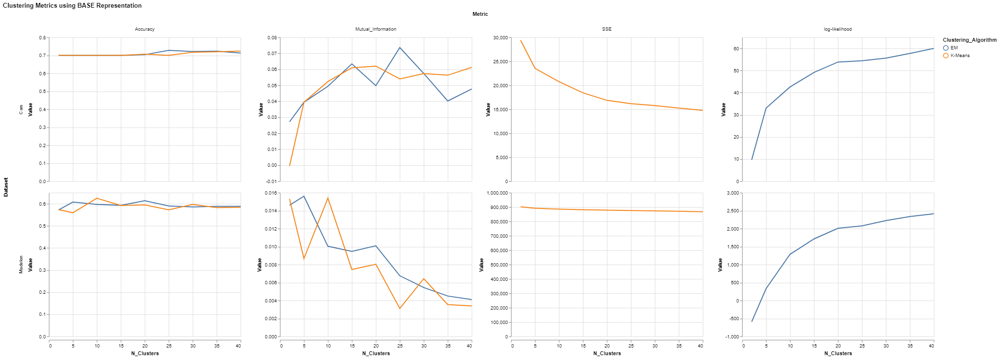



ICA



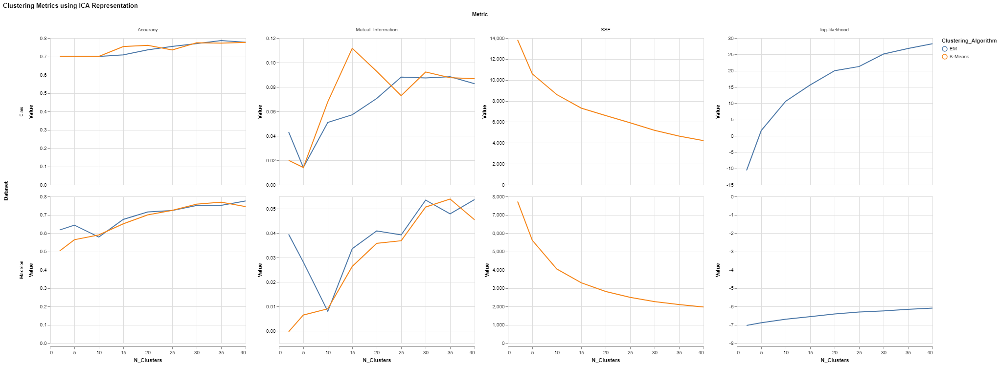



PCA



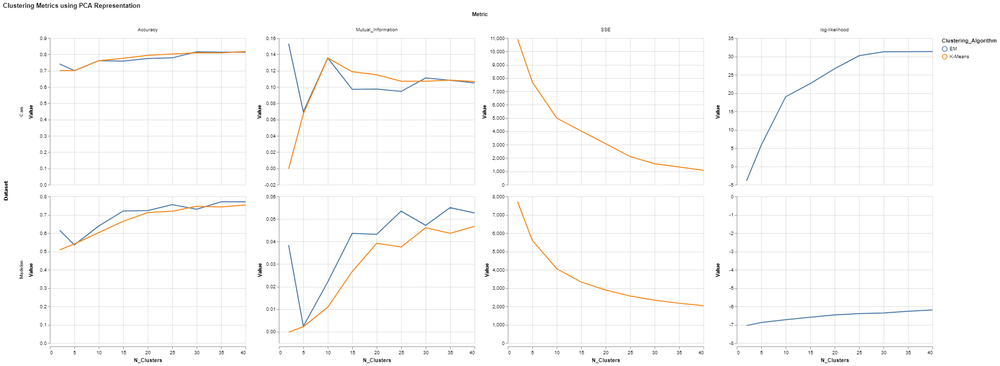



RP



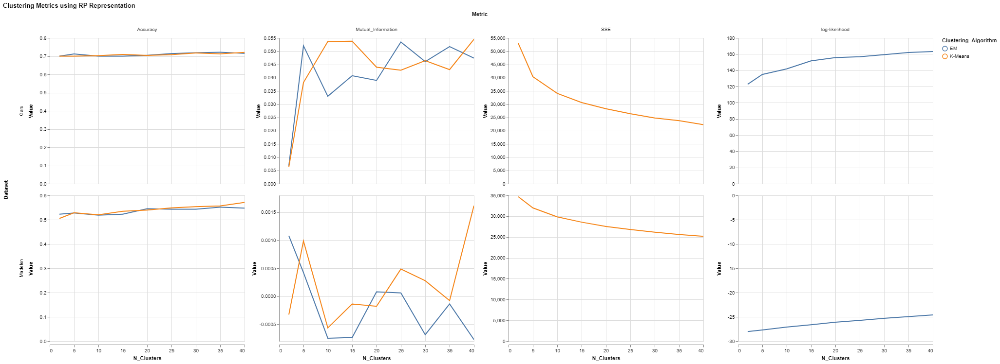



RF



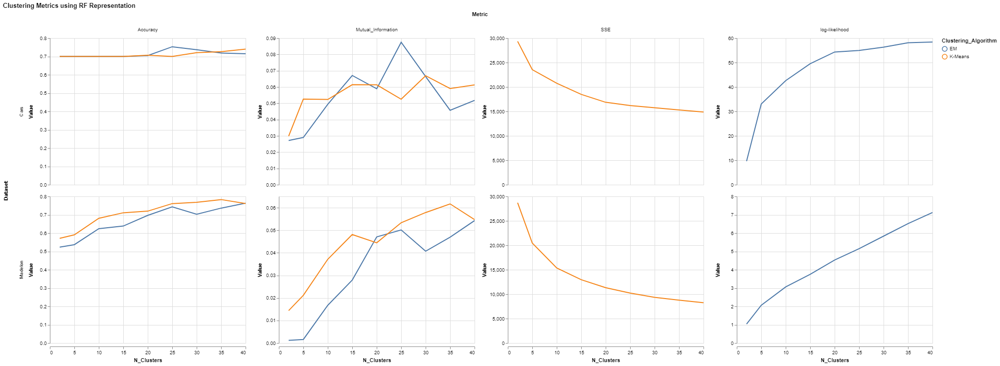

In [32]:
def clustering_line_metrics_combine_dataset_and_perspective(clustering_metrics_df, data_representation):
    """Given a tidy clustering metrics df and a list of datasets to subset and aggreagte by,
    as well as a data reprentation filter (e.g. 'PCA', 'ICA', etc) generate a compound chart
    across metrics and number of clusters
    """
    
    clustering_chart = alt.Chart(clustering_metrics_df).mark_line().encode(
        x=alt.X('N_Clusters:Q'),
        y=alt.Y('Value:Q'),
        color='Dataset-Perspective'
    ).facet(
        title=f'Clustering Metrics using {data_representation} Representation',
        column='Metric',
        row='Dataset',
    ).resolve_scale(
        y='Clustering_Algorithm'
    ).transform_filter(
        (alt.datum.Data_Perspective == representation)
    ).interactive()
    return clustering_chart

for representation in clustering_results.Data_Perspective.unique():
    print(f'\n{representation}\n')
    display(clustering_line_metrics_combine_dataset_and_perspective(clustering_results, representation))
    print()

#### Visualize Grid Search Data

In [212]:
grid_search_results.Clustering_Algorithm.unique()

array(['GMM', 'Kmeans', 'None'], dtype=object)

Group by N components and get the best test score

In [213]:
query_clustering_data = 1
query_clustering_algorithm = 'GMM'
query_clustering_data_perspective = 'ICA'
query_dataset = 'Cars'
analysis_data = grid_search_results.query('(Data_Perspective == @query_clustering_data_perspective)'
                         '& (Dataset == @query_dataset)'
                         '& (Clustered_Data == @query_clustering_data)')
if query_clustering_data == 1:
    analysis_data = analysis_data.query('Clustering_Algorithm == @query_clustering_algorithm')
analysis_data.groupby(by='N_Components/Clusters/Features').mean()['mean_test_score'].sort_values(ascending=False)

N_Components/Clusters/Features
20    0.728038
40    0.727691
30    0.721007
35    0.715480
25    0.712442
5     0.701331
10    0.701273
2     0.700231
15    0.694792
Name: mean_test_score, dtype: float64

## Visualize t-sne

In [214]:
tsne_results.head()

,X,Y,Target,Dataset,Data_Perspective
0,-31.615511,-25.296206,0.0,cars,BASE
1,-17.212791,-12.543370,0.0,cars,BASE
2,-27.641699,-27.702856,0.0,cars,BASE
3,-19.924063,-29.720591,0.0,cars,BASE
4,-17.961168,-15.166670,0.0,cars,BASE


## Before altering complexity

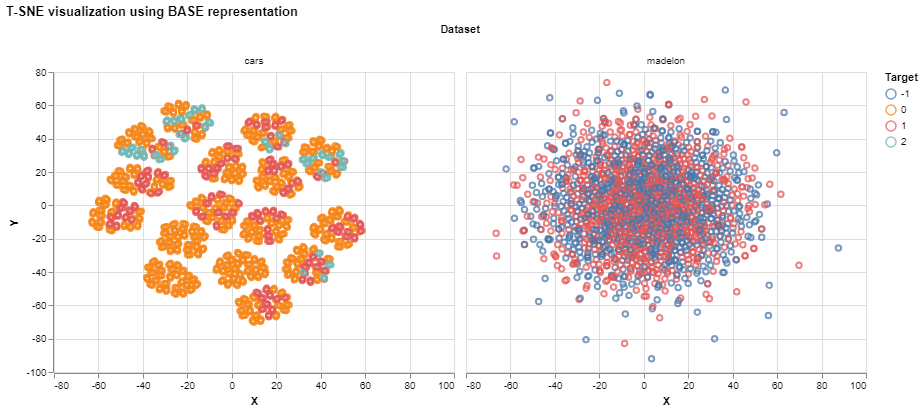

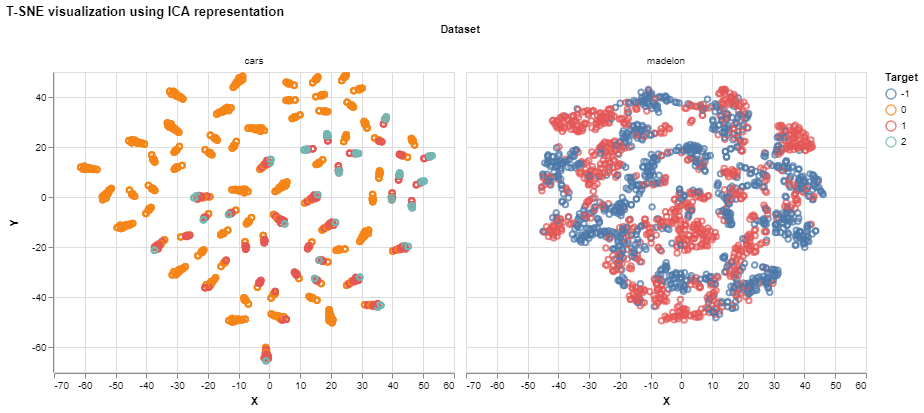

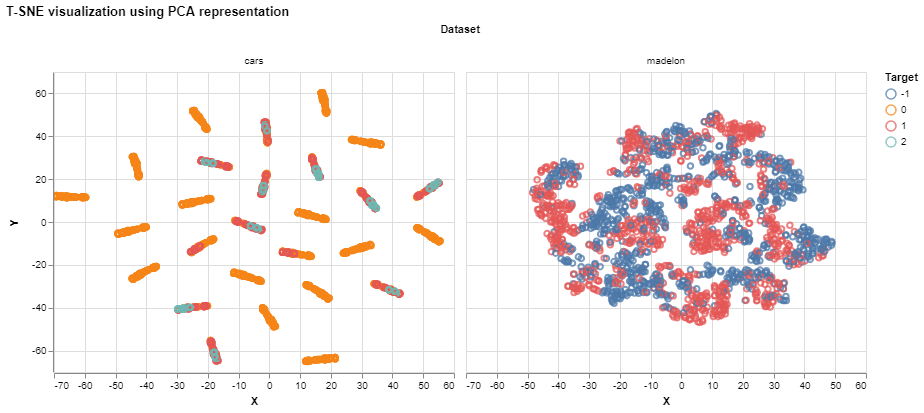

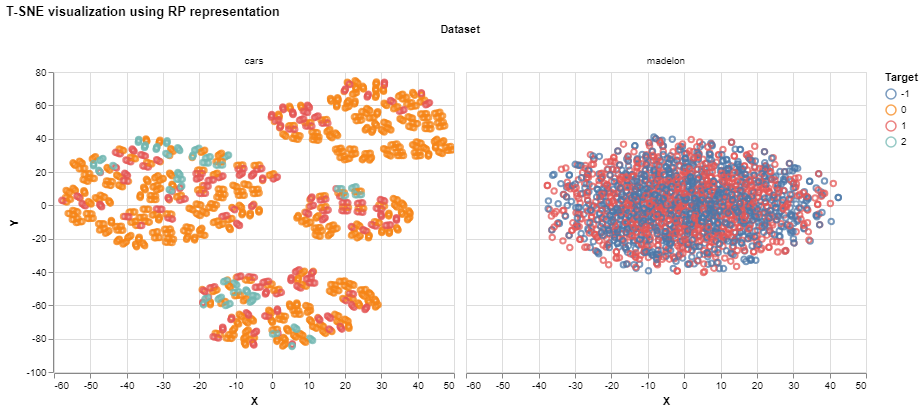

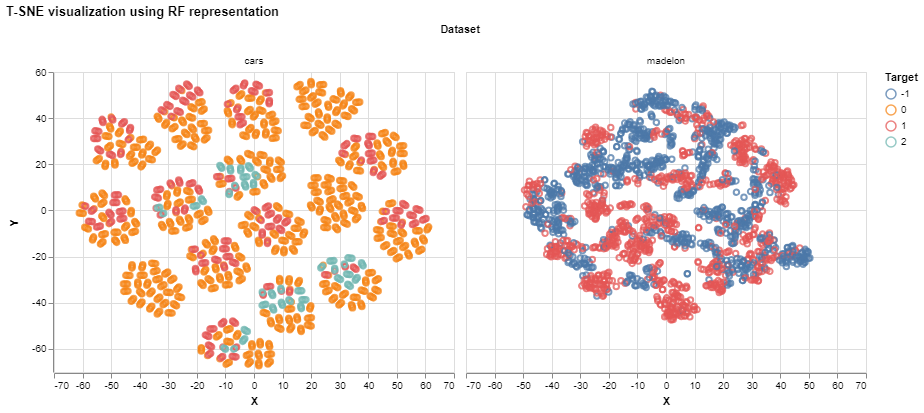

In [215]:
# representation = 'PCA'
# tmp_tsne = tsne_results.query('Data_Perspective == @representation')
# for 
# alt.Chart(tmp_tsne).mark_point(opacity=.75).encode(
#     x='X',
#     y='Y',
#     color='Target:N',
#     column='Dataset'
# )

def plot_tsne(tsne_results, data_representation):
    # Reduce the data so altair can plot
    tmp_tsne = tsne_results.query('Data_Perspective == @data_representation')
    tsne_chart = alt.Chart(tmp_tsne).mark_point(opacity=.75).encode(
        x='X',
        y='Y',
        color='Target:N',
        column='Dataset'
    ).properties(
        title = f'T-SNE visualization using {data_representation} representation',
    ).interactive()
    return tsne_chart
    
tsne_plots = []
for representation in clustering_results.Data_Perspective.unique():
#     print(f'\n{representation}\n')
    display(plot_tsne(tsne_results, representation))
    tsne_plots.append(plot_tsne(tsne_results, representation))
    print()    

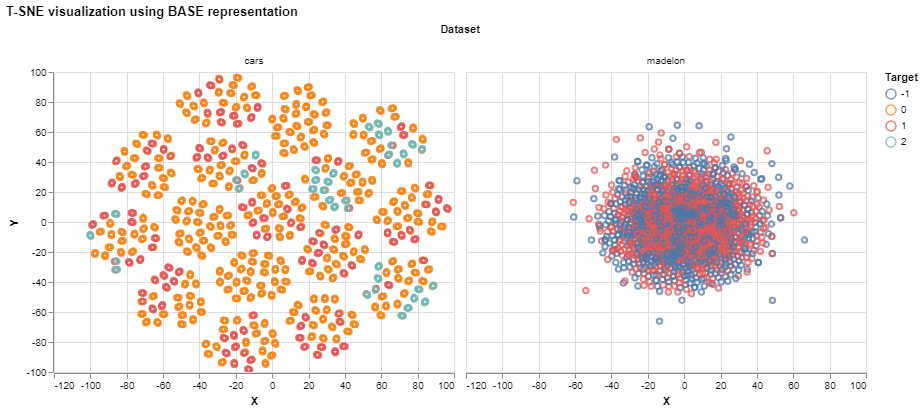

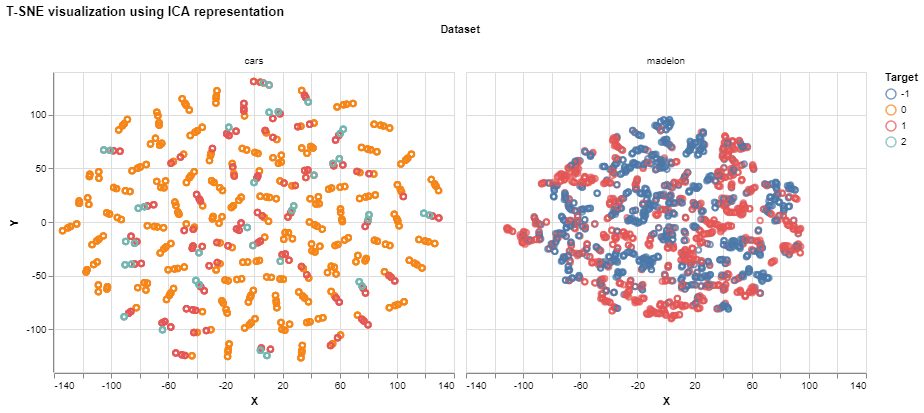

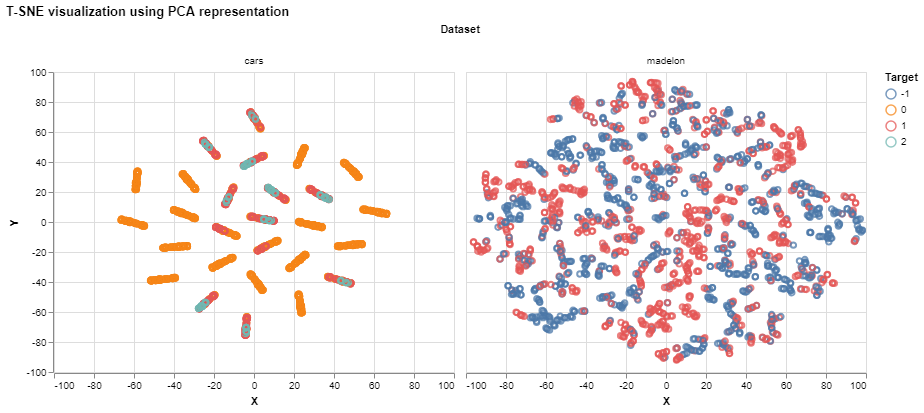

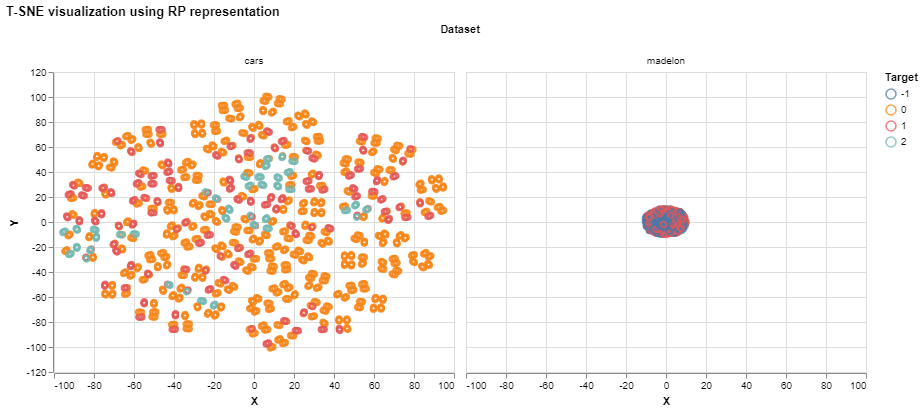

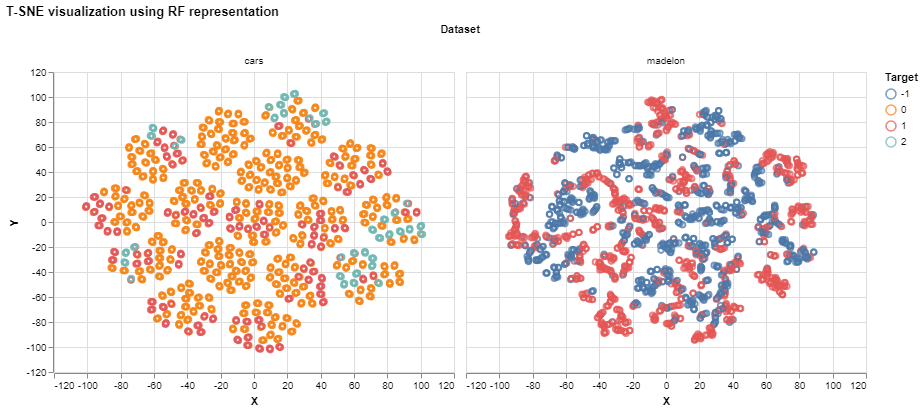

In [172]:
# representation = 'PCA'
# tmp_tsne = tsne_results.query('Data_Perspective == @representation')
# for 
# alt.Chart(tmp_tsne).mark_point(opacity=.75).encode(
#     x='X',
#     y='Y',
#     color='Target:N',
#     column='Dataset'
# )

def plot_tsne(tsne_results, data_representation):
    # Reduce the data so altair can plot
    tmp_tsne = tsne_results.query('Data_Perspective == @data_representation')
    tsne_chart = alt.Chart(tmp_tsne).mark_point(opacity=.75).encode(
        x='X',
        y='Y',
        color='Target:N',
        column='Dataset'
    ).properties(
        title = f'T-SNE visualization using {data_representation} representation',
    ).interactive()
    return tsne_chart
    
tsne_plots = []
for representation in clustering_results.Data_Perspective.unique():
#     print(f'\n{representation}\n')
    display(plot_tsne(tsne_results, representation))
    tsne_plots.append(plot_tsne(tsne_results, representation))
    print()    

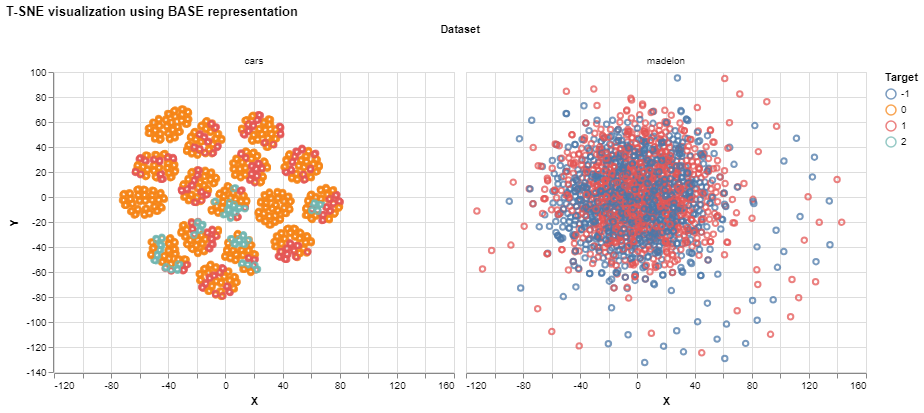

In [150]:
tsne_plots[0]

## Across all Metrics optimal number of components/clusters

In [93]:
optimal_numbers = pd.read_csv('results/optimal_numbers.csv')
optimal_numbers.head()

,Data_Perspective,Dataset,Data_Type,Metric,Optimal_Number,Metric_Rank
0,PCA,Cars,Feature_Transformation,Reconstruction Error,14,1
1,RP,Cars,Feature_Transformation,Reconstruction Error,20,2
2,ICA,Cars,Feature_Transformation,Reconstruction Error,14,1
3,PCA,Madelon,Feature_Transformation,Reconstruction Error,20,1
4,ICA,Madelon,Feature_Transformation,Reconstruction Error,20,1


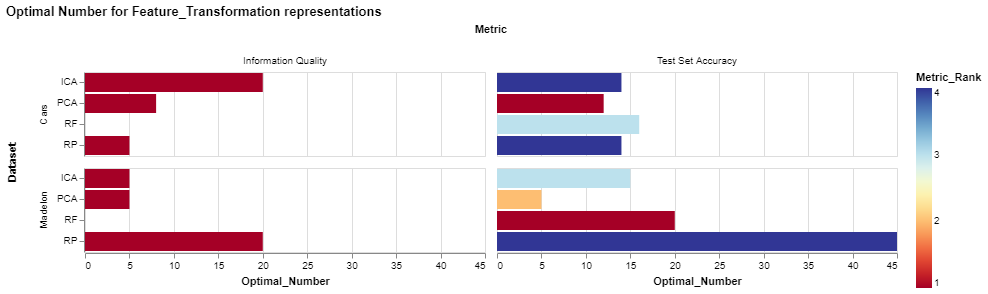

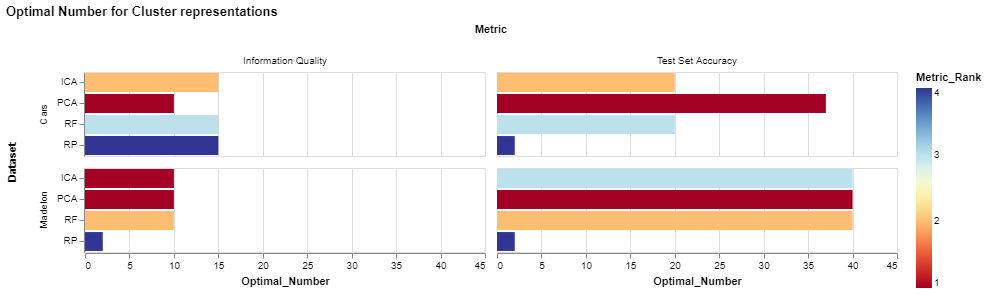

In [96]:
optimal_charts = []
for dtype in optimal_numbers.Data_Type.unique():
    chart = alt.Chart(optimal_numbers).mark_bar().encode(
        alt.X('Optimal_Number:Q', scale=alt.Scale(domain=[0, 45])),
        alt.Y('Data_Perspective:N', title=None),
        alt.Color('Metric_Rank', scale=alt.Scale(scheme='redyellowblue')),
        column = 'Metric:N',
        row = 'Dataset',
    ).transform_filter(
        (alt.datum.Data_Perspective != 'BASE')
        & (alt.datum.Data_Type == dtype)
        & (alt.datum.Metric != 'Reconstruction Error') # Remove reconstruction error so that cluster and feature transformation can vconcat
    ).properties(
        title=f'Optimal Number for {dtype} representations'
    )
    optimal_charts.append(chart)
    display(chart)
#alt.vconcat(*optimal_charts)